# Autoencoder

In [2]:
import numpy as np
import tensorboard
import torch
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import torchinfo

from torch.utils.tensorboard import SummaryWriter

from data import EmbeddingDataset, get_data_loaders, normalize_data, \
    get_swiss_roll_data
from trainer import train_autoencoder_swiss_roll, _train_swiss_roll, \
    train_word2vec_autoencoder, train_embedding, train_reconstruction
from nnAutoencoder import Autoencoder
from nnOldAutoencoder import OldAutoencoder
import nnHybridAutoencoder
from nnHybridAutoencoder import PretrainedAE

import plotter

pl.seed_everything(42)

%load_ext autoreload
%autoreload 2

Global seed set to 42


In [3]:
%%capture 
writer = SummaryWriter("tensorboard/")
%load_ext tensorboard
%tensorboard --logdir tensorboard/

Generate data in a reproducible way

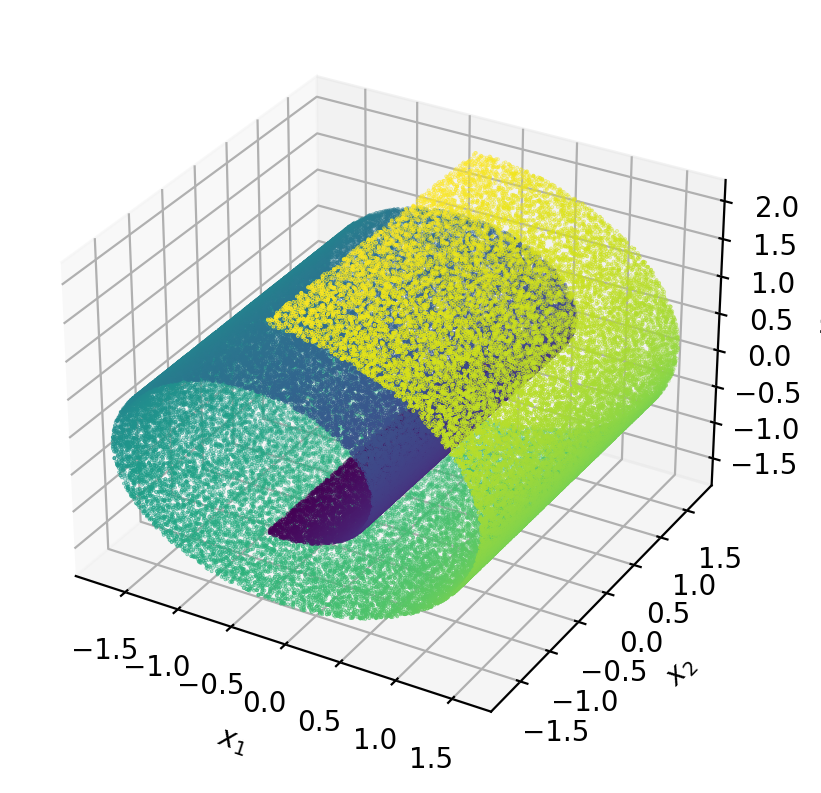

In [4]:
DATA_SR, COLOR_SR = get_swiss_roll_data(100000)
plotter.plot_swiss_roll(DATA_SR, c=COLOR_SR)

In [5]:
train_val_test_loaders = get_data_loaders(DATA_SR)

In [6]:
standard_AE, result = train_autoencoder_swiss_roll(*train_val_test_loaders, 
                                                    latent_dim=2,
                                                    data_dim=3,
                                                    title="swiss_roll_AE")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type    | Params | In sizes | Out sizes
-----------------------------------------------------------
0 | encoder | Encoder | 330 K  | [3]      | [2]      
1 | decoder | Decoder | 330 K  | [2]      | [3]      
-----------------------------------------------------------
660 K     Trainable params
0         Non-trainable params
660 K     Total params
2.644     Total estimated model params size (MB)


Epoch 462: 100%|██████████| 11/11 [00:00<00:00, 16.33it/s, loss=0.338, v_num=13]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]



Testing DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 98.68it/s] 


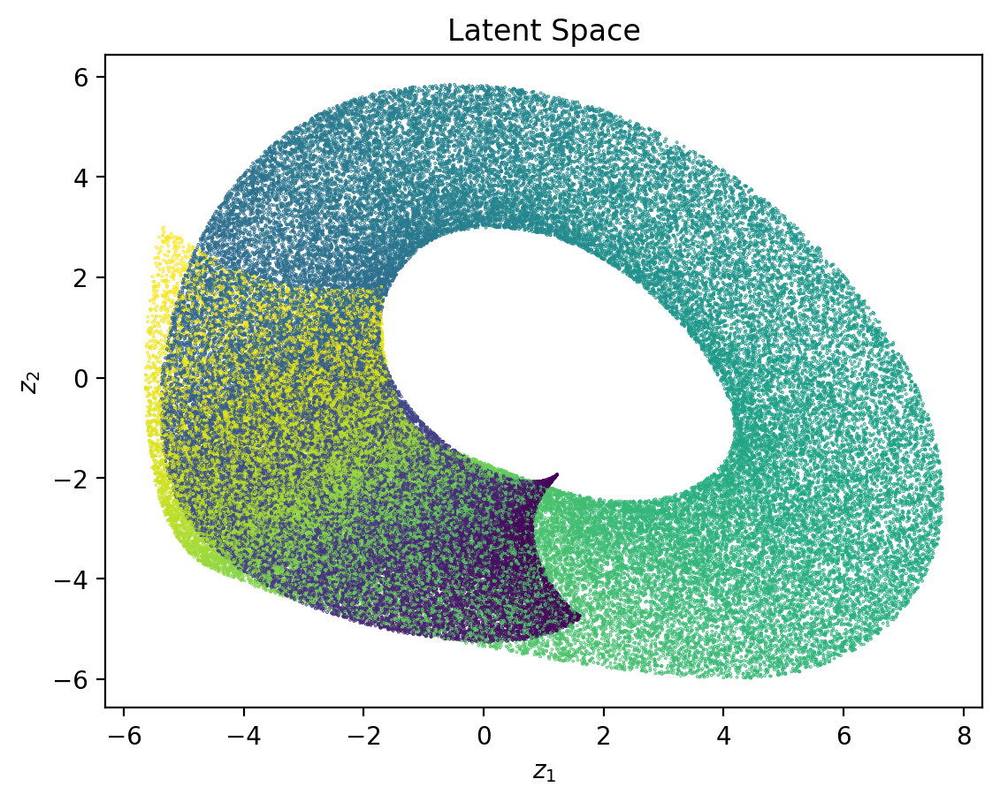

In [7]:
plotter.plot_2d_latent(standard_AE.eval().encoder(DATA_SR), c=COLOR_SR)

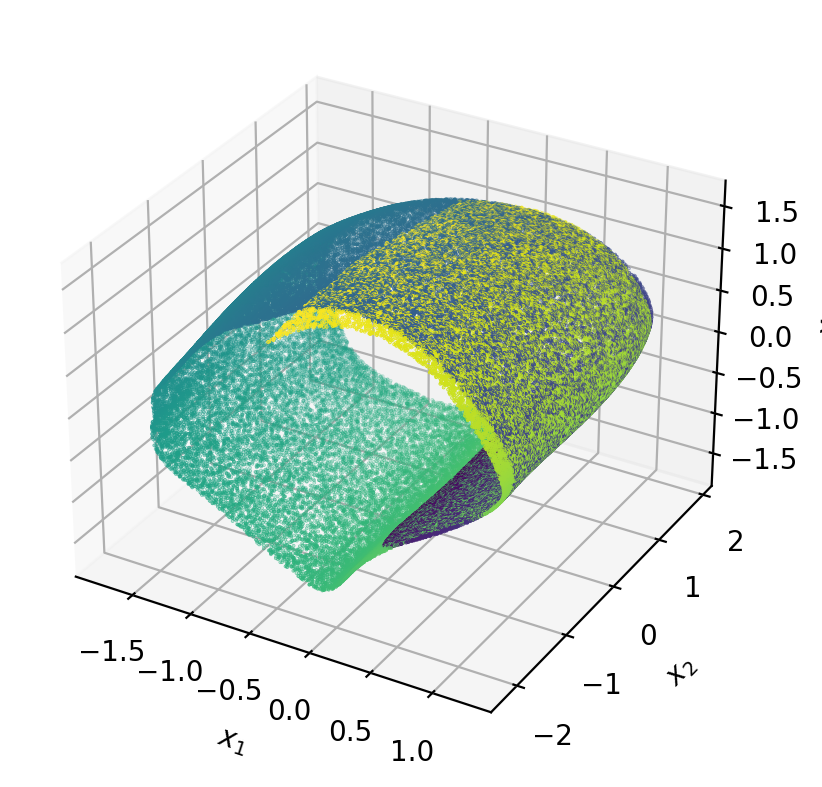

In [8]:
plotter.plot_swiss_roll(standard_AE.eval()(DATA_SR), c=COLOR_SR)

## Cherry-Pick Best Model
After training many with different stochastic initialisations

In [10]:
best_standard_AE = OldAutoencoder.load_from_checkpoint("./models/bestAE_swiss_roll/epoch=199-step=1800.ckpt")
torchinfo.summary(best_standard_AE)

Layer (type:depth-idx)                   Param #
OldAutoencoder                           --
├─Encoder: 1-1                           --
│    └─Sequential: 2-1                   --
│    │    └─Linear: 3-1                  1,024
│    │    └─ELU: 3-2                     --
│    │    └─Linear: 3-3                  65,792
│    │    └─ELU: 3-4                     --
│    │    └─Linear: 3-5                  65,792
│    │    └─ELU: 3-6                     --
│    │    └─Linear: 3-7                  65,792
│    │    └─ELU: 3-8                     --
│    │    └─Linear: 3-9                  65,792
│    │    └─ELU: 3-10                    --
│    │    └─Linear: 3-11                 65,792
│    │    └─ELU: 3-12                    --
│    │    └─Linear: 3-13                 514
├─Decoder: 1-2                           --
│    └─Sequential: 2-2                   --
│    │    └─Linear: 3-14                 768
│    │    └─ELU: 3-15                    --
│    │    └─Linear: 3-16                 65,79

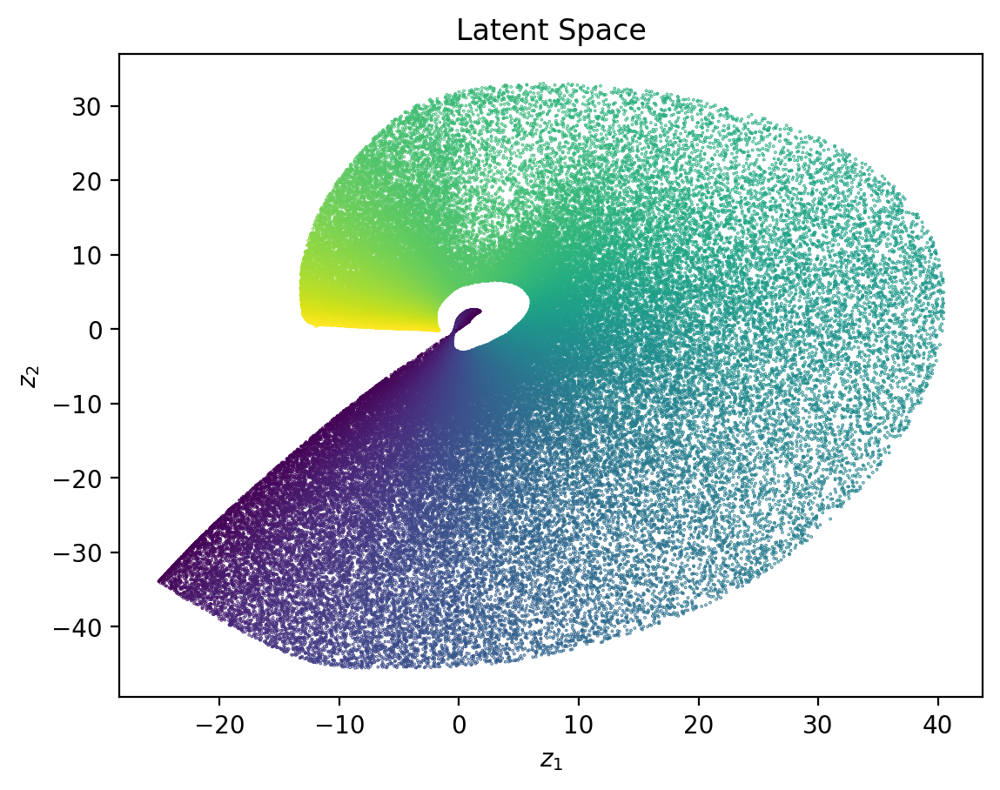

In [11]:
unnormalized_data, unnormalized_color = get_swiss_roll_data(100000, normalize=False)
unnormalized_data = torch.Tensor(unnormalized_data)
plotter.plot_2d_latent(best_standard_AE.encoder(unnormalized_data), c=unnormalized_color)

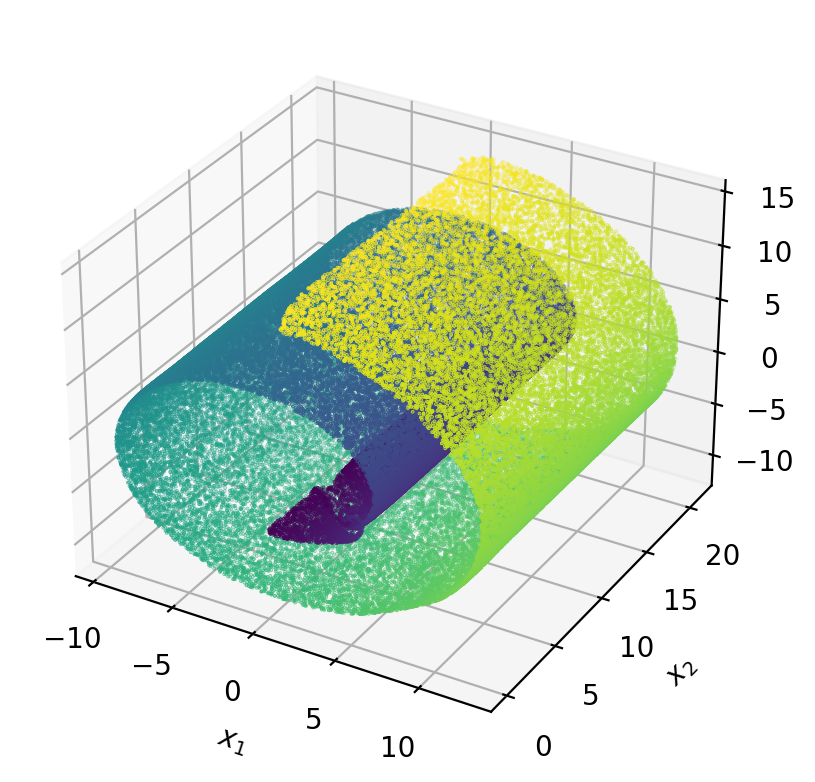

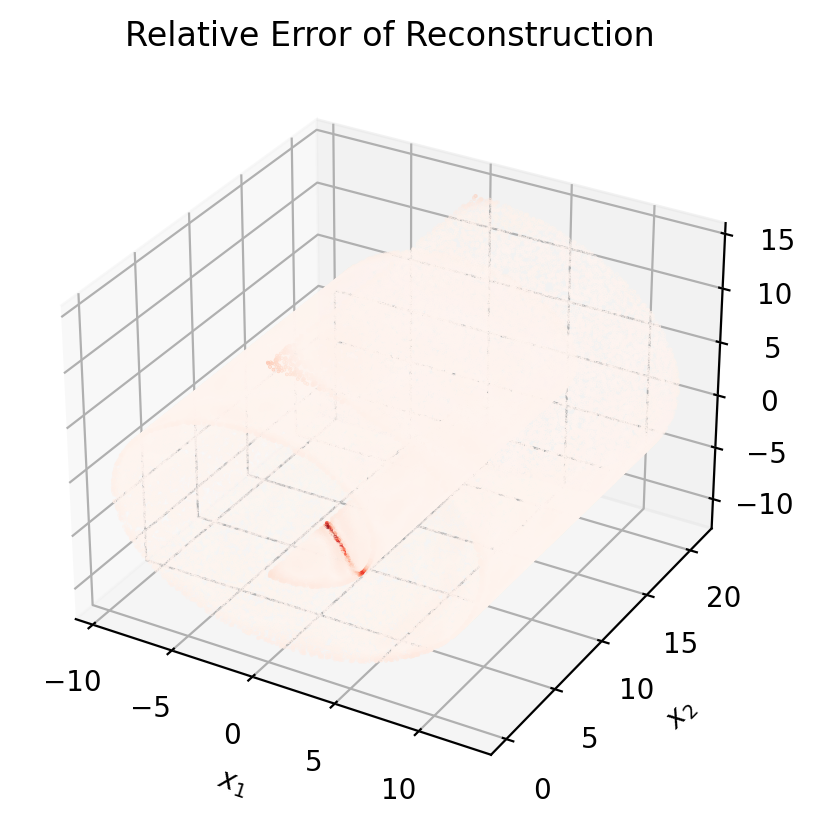

In [12]:
%matplotlib inline
plotter.plot_swiss_roll(best_standard_AE(unnormalized_data), c=unnormalized_color)
plotter.plot_swiss_roll_error(best_standard_AE(unnormalized_data), x_true=unnormalized_data)

## Try Hybrid Architecture

Load and normalize data

In [18]:
X = np.load("../embeddings/isomap_input.npy")
Z = np.load("../embeddings/isomap_label.npy")
X = (X - X.mean(axis=0)) / (X.std(axis=0))
Z = (Z - Z.mean(axis=0)) / (Z.std(axis=0))

In [14]:
isomap_dataset = EmbeddingDataset(X, Z)
isomap_dataloaders = get_data_loaders(isomap_dataset)

In [16]:
# encoder, result = train_embedding(*isomap_dataloaders, latent_dim=2, data_dim=3)
encoder = nnHybridAutoencoder.Encoder.load_from_checkpoint("./models/best_encoder_isomap/epoch=156-step=314.ckpt")

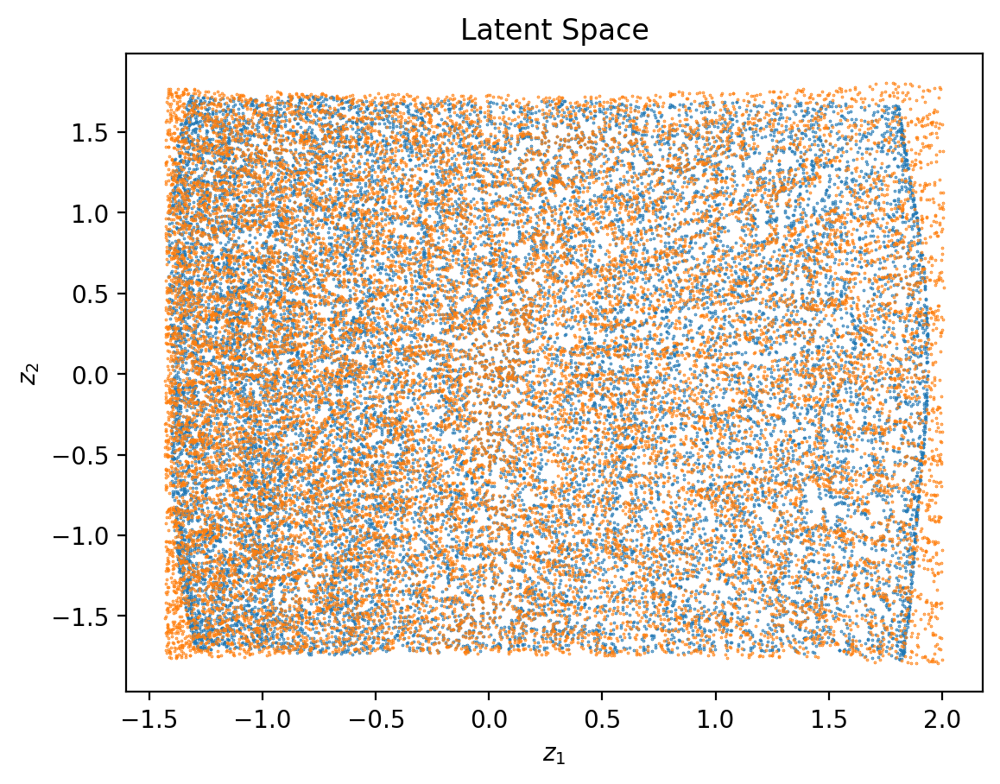

In [19]:
%matplotlib inline
Z_hat = encoder(torch.Tensor(X))
plotter.plot_2d_latent(Z_hat, Z)

In [20]:
dataset = EmbeddingDataset(Z_hat.detach().numpy(), X)
iso_reconstruction_dataloaders = get_data_loaders(dataset)

In [21]:
# decoder, result = train_reconstruction(*iso_reconstruction_dataloaders, latent_dim=2, data_dim=3)
decoder = nnHybridAutoencoder.Decoder.load_from_checkpoint("./models/best_decoder_isomap/epoch=689-step=1380.ckpt")

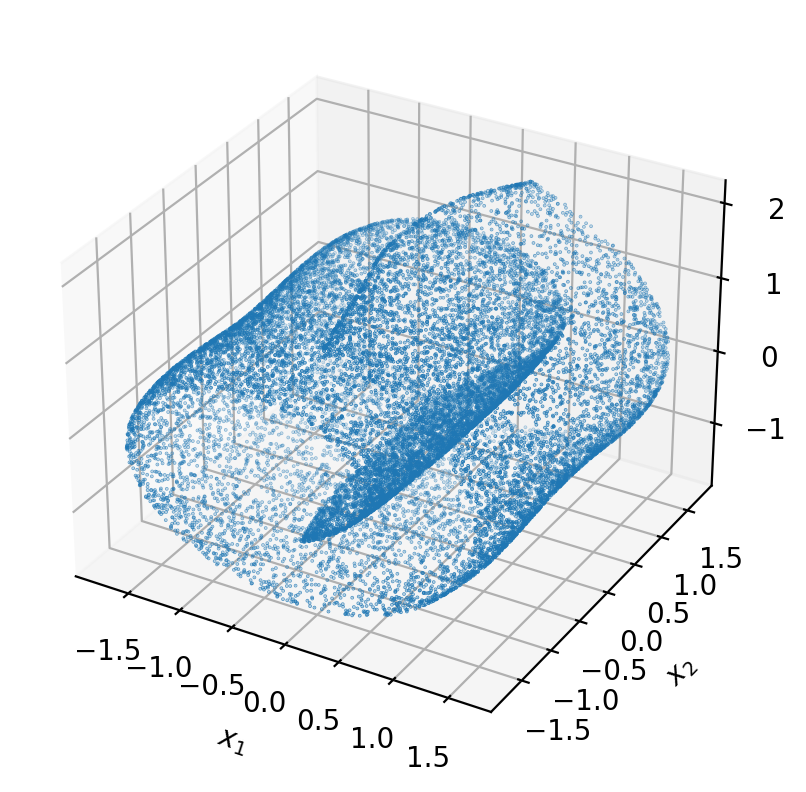

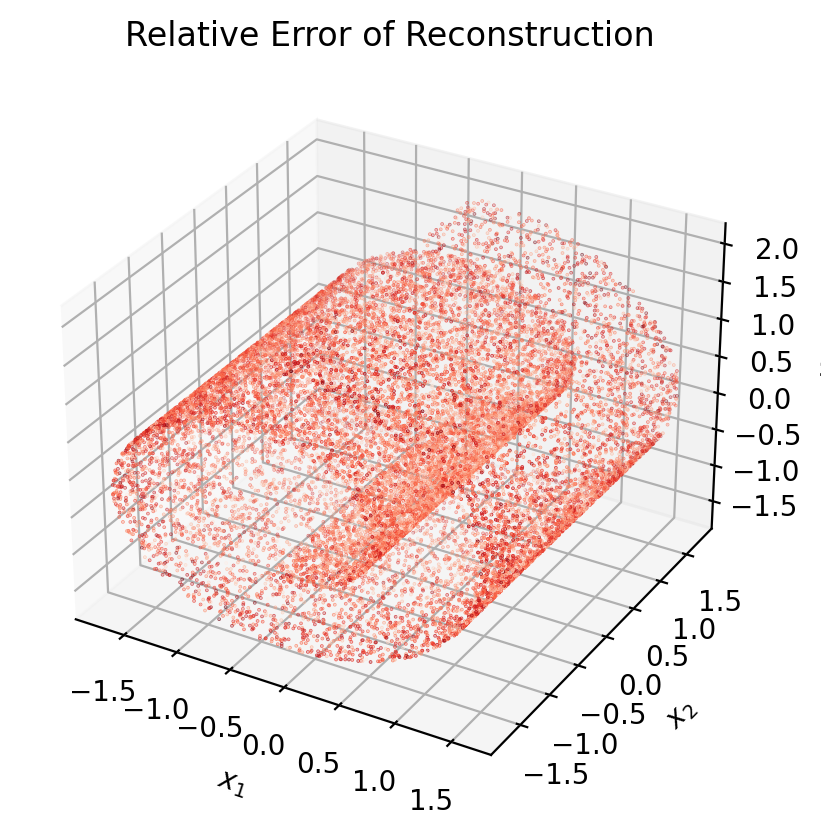

In [22]:
plotter.plot_swiss_roll(decoder(Z_hat))
plotter.plot_swiss_roll_error(decoder(Z_hat))

In [23]:
path_encoder = "./models/best_encoder_isomap/epoch=156-step=314.ckpt"
path_decoder = "./models/best_decoder_isomap/epoch=689-step=1380.ckpt"

pretrained_AE = PretrainedAE(path_encoder, path_decoder)

In [28]:
# refined_AE, result = _train_swiss_roll(pretrained_AE, *train_val_test_loaders, title="pretrained")
refined_AE = PretrainedAE.load_from_checkpoint("./models/best_pretrained_AE/epoch=234-step=2115.ckpt")

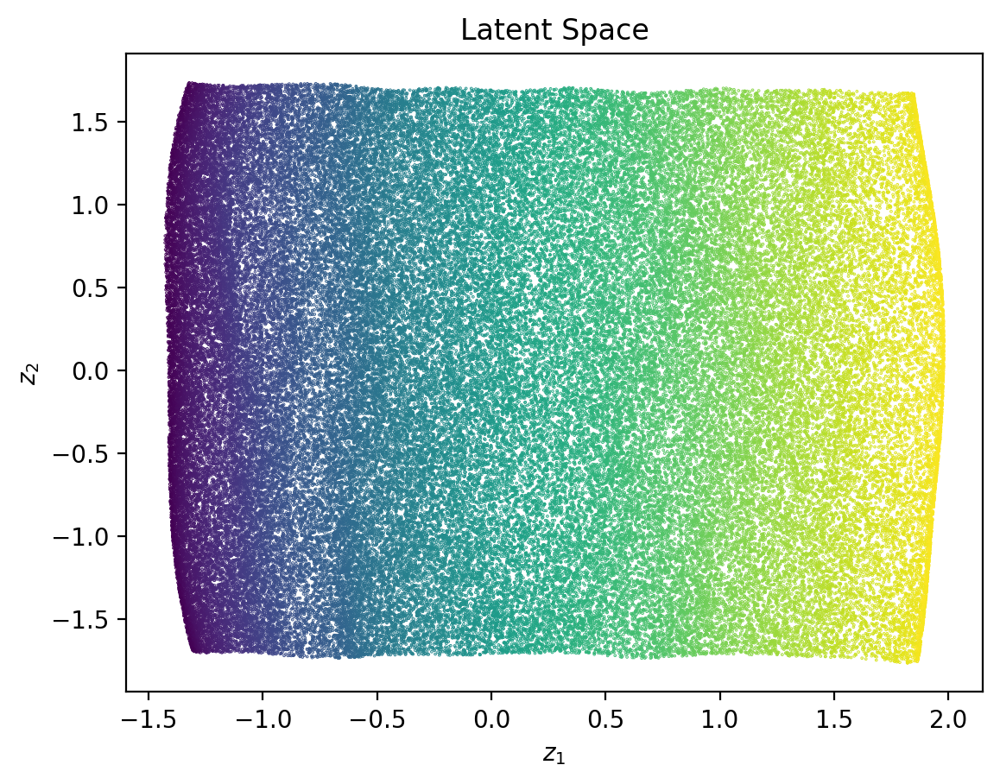

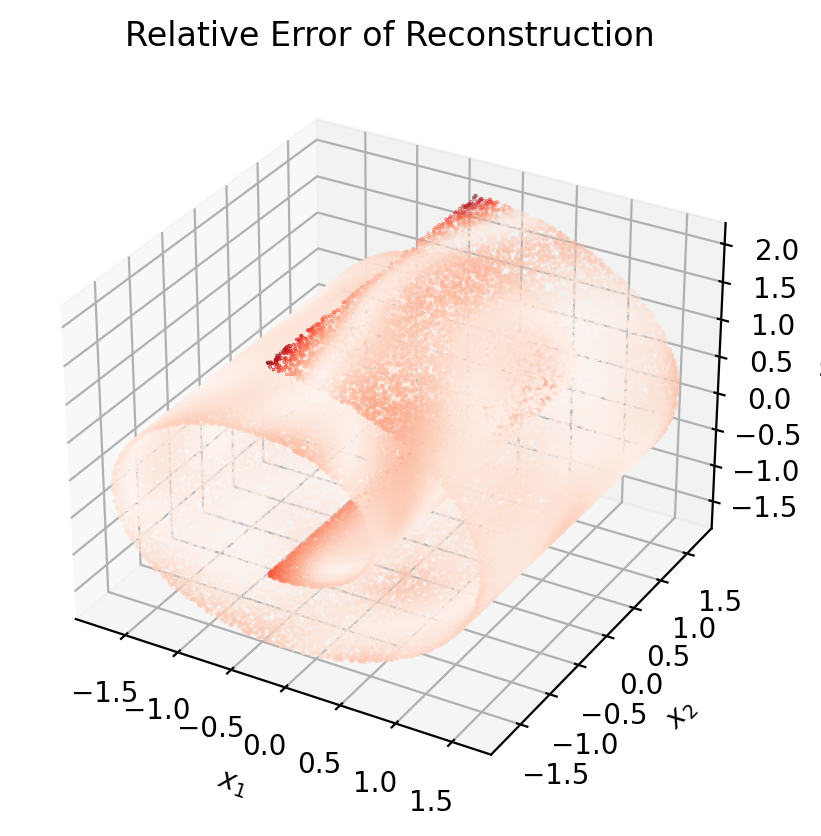

In [29]:
plotter.plot_2d_latent(refined_AE.encoder(DATA_SR), c=COLOR_SR)
plotter.plot_swiss_roll_error(refined_AE(DATA_SR))

In [ ]:
X = np.load("./sepctral embedding/se_input.npy")
Z = np.load("./sepctral embedding/se_label.npy")
X = (X - X.mean(axis=0)) / (X.std(axis=0))
Z = (Z - Z.mean(axis=0)) / (Z.std(axis=0))

In [ ]:
se_dataset = EmbeddingDataset(X, Z)
se_dataloaders = get_data_loaders(se_dataset)

In [ ]:
model, result = train_embedding(*se_dataloaders, latent_dim=2, data_dim=3)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type       | Params
------------------------------------
0 | net  | Sequential | 463 K 
------------------------------------
463 K     Trainable params
0         Non-trainable params
463 K     Total params
1.852     Total estimated model params size (MB)
/home/ese/miniconda3/envs/MLCMS/lib/python3.10/site-packages/pytorch_lightning/loggers/tensorboard.py:246: UserWarning: Could not log computational graph to TensorBoard: The `model.example_input_array` attribute is not set or `input_array` was not given.
  rank_zero_warn(


Epoch 607:  67%|██████▋   | 2/3 [00:00<00:00,  3.75it/s, loss=1.66, v_num=22]

Exception ignored in: <function _releaseLock at 0x7fbb29b4fe20>
Traceback (most recent call last):
  File "/home/ese/miniconda3/envs/MLCMS/lib/python3.10/logging/__init__.py", line 228, in _releaseLock
    def _releaseLock():
KeyboardInterrupt: 


: 

: 

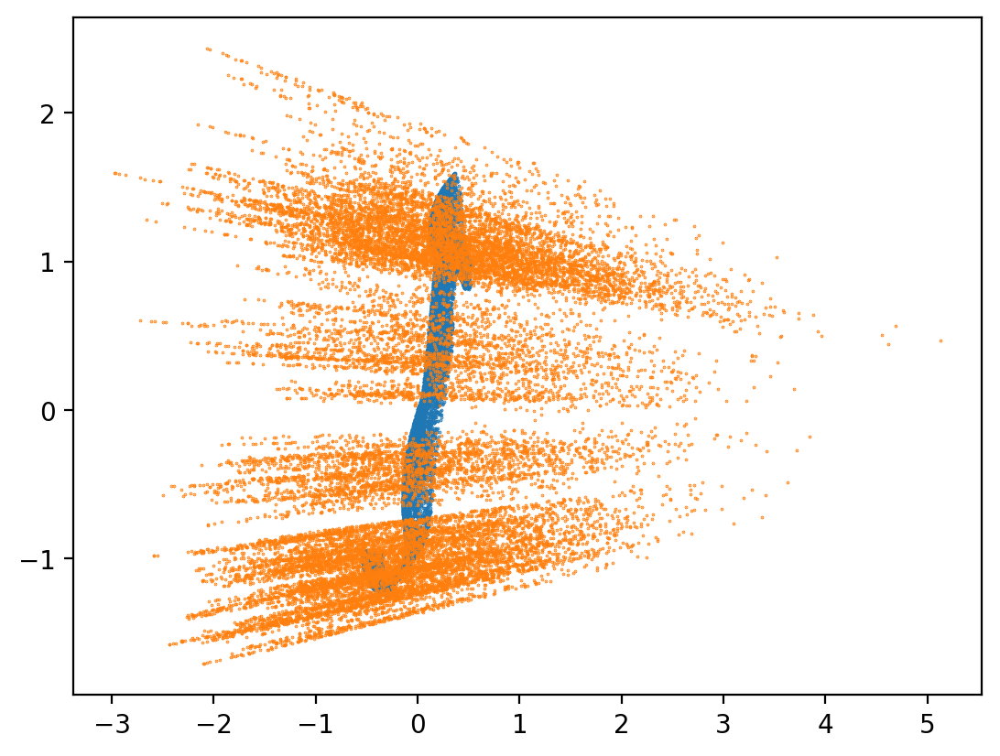

In [ ]:
z_plot = model(torch.Tensor(X)).detach().numpy()
plt.scatter(z_plot[:, 0], z_plot[:, 1], s = 0.1)
plt.scatter(Z[:, 0], Z[:, 1], s = 0.1)

## Word2Vec

For the Word2Vec dataset we use an Autoencoder to 

In [ ]:
from gensim.models import Word2Vec
import gensim.downloader

You may specify the local subdirectory for saving gensim data using the GENSIM_DATA_DIR environment variable. For example:
```
$ export GENSIM_DATA_DIR=/tmp/gensim-data $ python -m gensim.downloader –download <dataname>
```
By default, this subdirectory is ~/gensim-data.

In [ ]:
google_news_300_vectors = gensim.downloader.load('word2vec-google-news-300')

In [ ]:
vecs = google_news_300_vectors.vectors
# id_to_key = google_news_300_vectors.index_to_key
VECS = torch.Tensor(vecs)

Normalize Input

In [ ]:
# VECS = VECS - torch.mean(VECS, dim=0)
# VECS = 2 * (VECS + VECS.min()) / (VECS.max() - VECS.min()) - 1
# VECS = torch.nn.functional.normalize(VECS, p=1, dim=1)
# torch.norm(VECS, p=1, dim=1)

In [ ]:
vec_loaders = get_data_loaders(VECS, batch_size=16000, train_ratio=1, val_ratio=0, test_ratio=0)
loader, _, _ = vec_loaders

In [ ]:
model, result = train_word2vec_autoencoder(loader, latent_dim=100, data_dim=300)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type    | Params | In sizes | Out sizes
-----------------------------------------------------------
0 | encoder | Encoder | 2.0 M  | [300]    | [100]    
1 | decoder | Decoder | 2.0 M  | [100]    | [300]    
-----------------------------------------------------------
4.1 M     Trainable params
0         Non-trainable params
4.1 M     Total params
16.353    Total estimated model params size (MB)


Epoch 6: 100%|██████████| 188/188 [00:35<00:00,  5.32it/s, loss=11, v_num=14]      


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing DataLoader 0: 100%|██████████| 188/188 [00:11<00:00, 16.00it/s]


: 

In [ ]:
# vec_model = Autoencoder(300, 300, 100).cuda()
# optim = torch.optim.Adam(vec_model.parameters(), lr=1e-3)
# from torchinfo import summary
# summary(vec_model)
# for epoch in range(10):
#     for id, batch in enumerate(train_loader):
#         batch = batch.cuda()
#         optim.zero_grad()
#         loss = vec_model.training_step(batch, id)
#         loss.backward()
#         optim.step()
#         if id % 50 == 0:
#             print("Loss:", loss)
#     print("EPOCH :", epoch)